In [7]:
import numpy as np
import pandas as pd

In [26]:
movies=pd.read_csv(r"C:\Users\johnf\forks\Netflix\Data\netflix_movies_detailed_up_to_2025.csv")
shows=pd.read_csv(r"C:\Users\johnf\forks\Netflix\Data\netflix_tv_shows_detailed_up_to_2025.csv")

In [27]:
import seaborn as sns
import matplotlib.pyplot as plt

In [45]:
import importlib
import helper_functions

importlib.reload(helper_functions)

C:\Users\johnf\forks\Netflix\helper_functions.py:1171: SyntaxWarning:

invalid escape sequence '\s'



<module 'helper_functions' from 'C:\\Users\\johnf\\forks\\Netflix\\helper_functions.py'>

In [46]:
from helper_functions import Ftest, generate_boxplot, LSD_test, genre_wordcloud, generate_boxplot_interactive, generate_treemap, generate_interactive_scatter

# Movies only

In [30]:
missing_percentage = movies.isnull().mean() * 100
print(missing_percentage)

show_id           0.00000
type              0.00000
title             0.00000
director          0.82500
cast              1.27500
country           2.91250
date_added        0.00000
release_year      0.00000
rating            0.00000
duration        100.00000
genres            0.66875
language          0.00000
description       0.82500
popularity        0.00000
vote_count        0.00000
vote_average      0.00000
budget            0.00000
revenue           0.00000
dtype: float64


In [31]:
movies.drop(columns=['duration'],inplace=True)
movies=movies.fillna('missing')

In [32]:
movies_exp=movies.copy()
movies_exp['genres']=movies_exp['genres'].apply(lambda x: [genre.strip() for genre in x.split(',')])

In [33]:
df=movies.copy()
df['genres'] = df['genres'].str.split(', ')
movies_exploded = df.explode('genres', ignore_index=True)
movies_exploded=movies_exploded[movies_exploded['genres']!='missing']

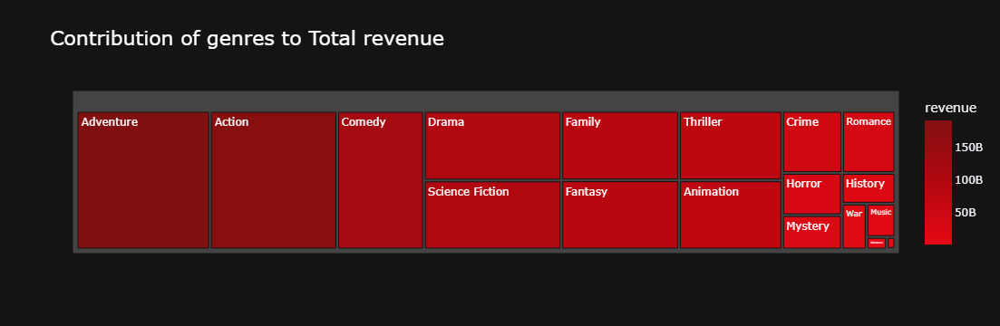

In [50]:
generate_treemap(movies_exploded,'genres','revenue')

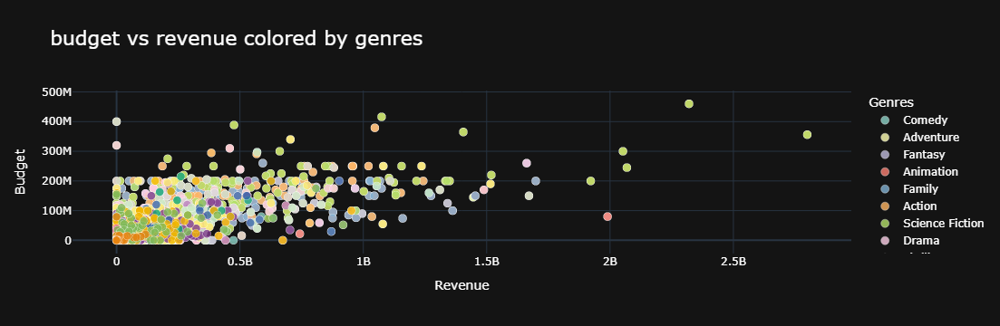

In [43]:
generate_interactive_scatter(movies_exploded,'revenue','budget','genres','title')

## Rating Analysis for each genre

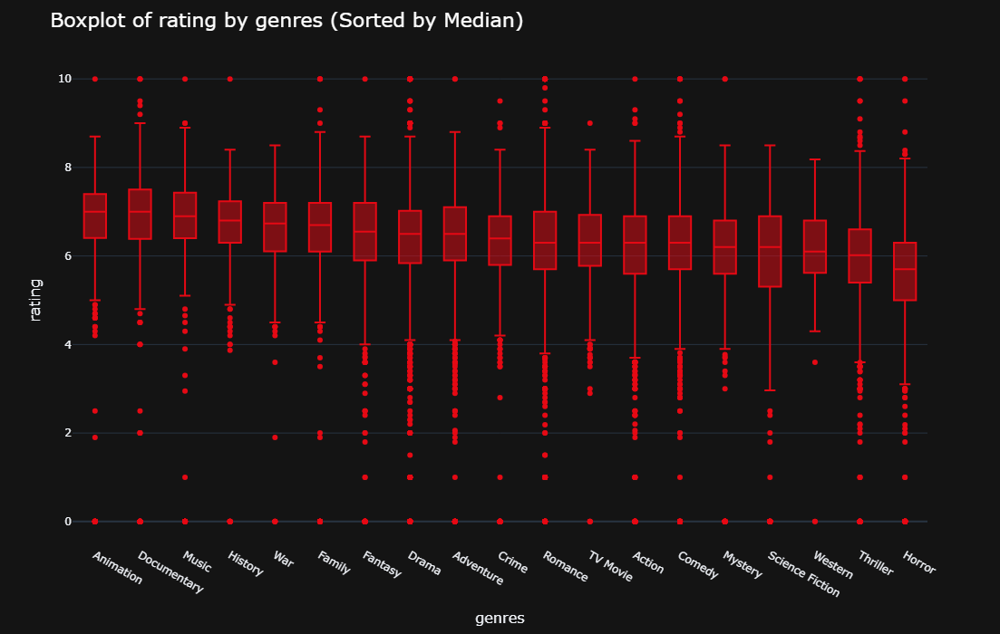

In [47]:
generate_boxplot_interactive(movies_exploded,'genres','rating',True)

### F-test to check whether the difference between genre rating means are significant or not

In [14]:
f_stat,f_crit,sse_rating=Ftest(movies_exploded,'genres','rating',0.05)
print(f_stat," ",f_crit)

67.79061804407597   1.6041256128850678


### LSD test to find the significant differences

In [15]:
dic=LSD_test(movies_exploded,'genres','rating',sse_rating,0.05)

In [16]:
for key,val in dic.items():
    if len(val)==0:
        print(key,"is not significantly higher rated than any genre")
        print()
    else:
        print(key,"is significantly higher rated than the following genres:")
        for g in val:
            print(g)
        print()

Music is significantly higher rated than the following genres:
Western
Mystery
Horror
TV Movie
Thriller
Comedy
Adventure
Drama
Crime
Science Fiction
Romance
Action
Documentary
Fantasy

Western is significantly higher rated than the following genres:
Horror

Mystery is significantly higher rated than the following genres:
Horror
Thriller

Horror is not significantly higher rated than any genre

TV Movie is significantly higher rated than the following genres:
Mystery
Horror
Thriller
Comedy
Science Fiction
Romance
Action

Thriller is significantly higher rated than the following genres:
Horror

Comedy is significantly higher rated than the following genres:
Horror
Thriller
Science Fiction
Romance

Adventure is significantly higher rated than the following genres:
Mystery
Horror
Thriller
Comedy
Drama
Crime
Science Fiction
Romance
Action
Documentary

Drama is significantly higher rated than the following genres:
Mystery
Horror
Thriller
Comedy
Science Fiction
Romance
Action

Crime is signif

## Popularity vs Genre Analysis

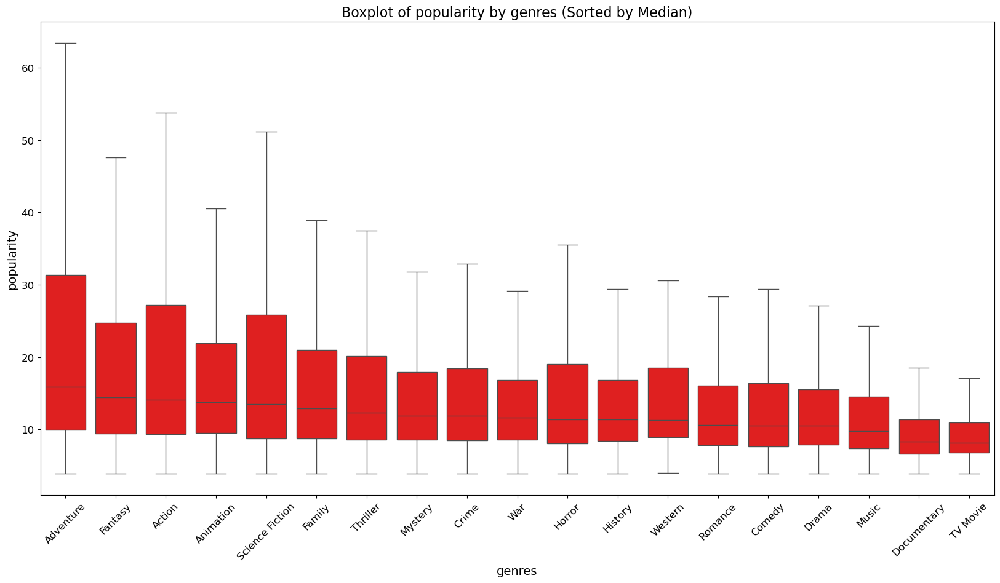

In [66]:
generate_boxplot(movies_exploded,'genres','popularity',False)

### F-test to check whether the difference between genre popularity means are significant or not

In [18]:
f_stat,f_crit,sse_pop=Ftest(movies_exploded,'genres','popularity',0.05)
print(f_stat," ",f_crit)

13.963610679717288   1.6041256128850678


### LSD test to find the significant differences

In [19]:
dic=LSD_test(movies_exploded,'genres','popularity',sse_pop,0.05)

In [20]:
for key,val in dic.items():
    if len(val)==0:
        print(key,"is not significantly higher popularity rated than any genre")
        print()
    else:
        print(key,"is significantly higher popularity rated than the following genres:")
        for g in val:
            print(g)
        print()

Music is not significantly higher popularity rated than any genre

Western is not significantly higher popularity rated than any genre

Mystery is not significantly higher popularity rated than any genre

Horror is significantly higher popularity rated than the following genres:
TV Movie
Drama
Documentary

TV Movie is not significantly higher popularity rated than any genre

Thriller is significantly higher popularity rated than the following genres:
Music
Mystery
TV Movie
Comedy
Drama
Romance
Documentary
History

Comedy is significantly higher popularity rated than the following genres:
TV Movie
Documentary

Adventure is significantly higher popularity rated than the following genres:
Music
Western
Mystery
Horror
TV Movie
Thriller
Comedy
Drama
Crime
Family
Romance
War
Documentary
History
Animation
Fantasy

Drama is significantly higher popularity rated than the following genres:
Documentary

Crime is significantly higher popularity rated than the following genres:
TV Movie
Drama
Docum

## Revenue vs Genre Analysis

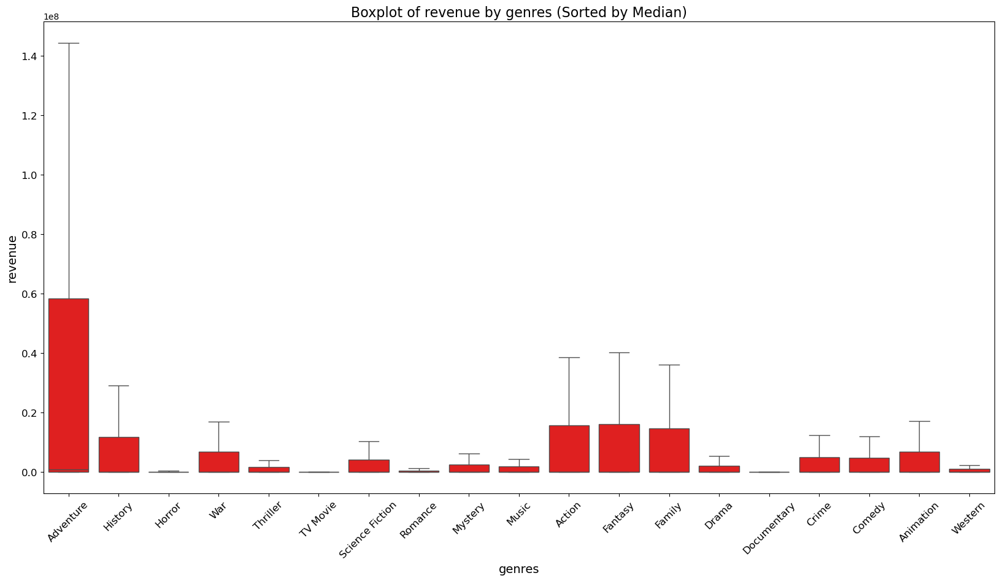

In [21]:
generate_boxplot(movies_exploded,'genres','revenue',False)

In [22]:
f_stat,f_crit,sse_rev=Ftest(movies_exploded,'genres','revenue',0.05)
print(f_stat," ",f_crit)

80.84625176052512   1.6041256128850678


In [23]:
dic=LSD_test(movies_exploded,'genres','revenue',sse_rev,0.05)

In [24]:
for key,val in dic.items():
    if len(val)==0:
        print(key,"does not generate higher revenue than any genre")
        print()
    else:
        print(key,"generates more revenue than the following genres:")
        for g in val:
            print(g)
        print()

Music generates more revenue than the following genres:
TV Movie
Documentary

Western does not generate higher revenue than any genre

Mystery generates more revenue than the following genres:
TV Movie
Documentary

Horror generates more revenue than the following genres:
Documentary

TV Movie does not generate higher revenue than any genre

Thriller generates more revenue than the following genres:
Horror
TV Movie
Drama
Romance
Documentary

Comedy generates more revenue than the following genres:
Mystery
Horror
TV Movie
Thriller
Drama
Romance
Documentary

Adventure generates more revenue than the following genres:
Music
Western
Mystery
Horror
TV Movie
Thriller
Comedy
Drama
Crime
Family
Science Fiction
Romance
War
Action
Documentary
History
Animation
Fantasy

Drama generates more revenue than the following genres:
TV Movie
Documentary

Crime generates more revenue than the following genres:
Horror
TV Movie
Drama
Romance
Documentary

Family generates more revenue than the following genre

## Budget vs Revenue Analysis

In [25]:
genre_corr = (
    movies_exploded
    .groupby('genres')
    .apply(lambda x: x['budget'].corr(x['revenue']))
    .sort_values(ascending=False)
)

print(genre_corr)

genres
Action             0.790401
Science Fiction    0.787074
Western            0.785183
Adventure          0.759486
Family             0.758960
Animation          0.750856
Romance            0.722749
War                0.720215
Comedy             0.716818
Fantasy            0.715292
Crime              0.701706
Thriller           0.677161
Horror             0.674710
Drama              0.671039
Mystery            0.658061
Music              0.582805
History            0.547384
Documentary        0.355798
TV Movie           0.080441
dtype: float64


C:\Users\johnf\AppData\Local\Temp\ipykernel_12032\3008262812.py:4: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



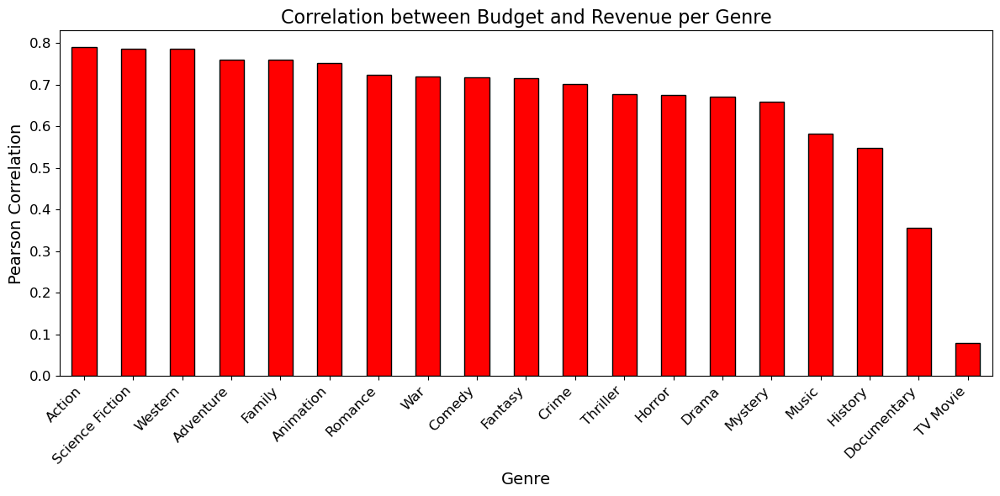

In [26]:
plt.figure(figsize=(12, 6))
genre_corr.plot(kind='bar', color='red', edgecolor='black')

plt.title("Correlation between Budget and Revenue per Genre", fontsize=16)
plt.xlabel("Genre", fontsize=14)
plt.ylabel("Pearson Correlation", fontsize=14)
plt.xticks(rotation=45, ha='right', fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
# plt.savefig('correlation between budget and revenue per genre.png')
plt.show()

## Budget vs Popularity Analysis

In [27]:
genre_corr = (
    movies_exploded
    .groupby('genres')
    .apply(lambda x: x['budget'].corr(x['popularity']))
    .sort_values(ascending=False)
)

print(genre_corr)

genres
Western            0.465539
Music              0.461681
Fantasy            0.371040
History            0.298243
Animation          0.295967
Family             0.287179
Comedy             0.273252
Mystery            0.268279
Adventure          0.266870
Drama              0.255399
Horror             0.211264
Action             0.200538
Science Fiction    0.187835
Thriller           0.132917
Crime              0.123094
War                0.102780
Romance            0.084308
TV Movie           0.051684
Documentary        0.005240
dtype: float64


C:\Users\johnf\AppData\Local\Temp\ipykernel_12032\1695611340.py:4: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



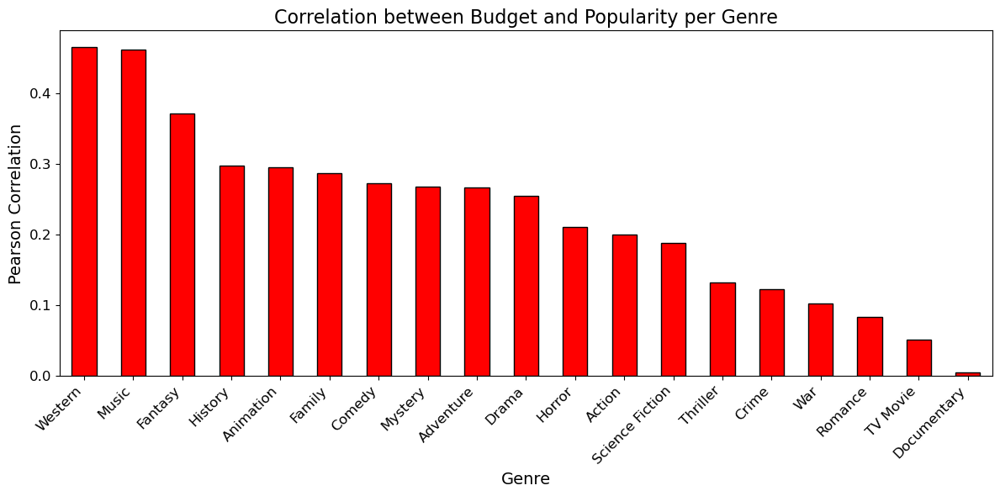

In [28]:
plt.figure(figsize=(12, 6))
genre_corr.plot(kind='bar', color='red', edgecolor='black')

plt.title("Correlation between Budget and Popularity per Genre", fontsize=16)
plt.xlabel("Genre", fontsize=14)
plt.ylabel("Pearson Correlation", fontsize=14)
plt.xticks(rotation=45, ha='right', fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
# plt.savefig('correlation between budget and populairity per genre.png')
plt.show()

## Popularity of every genre with time

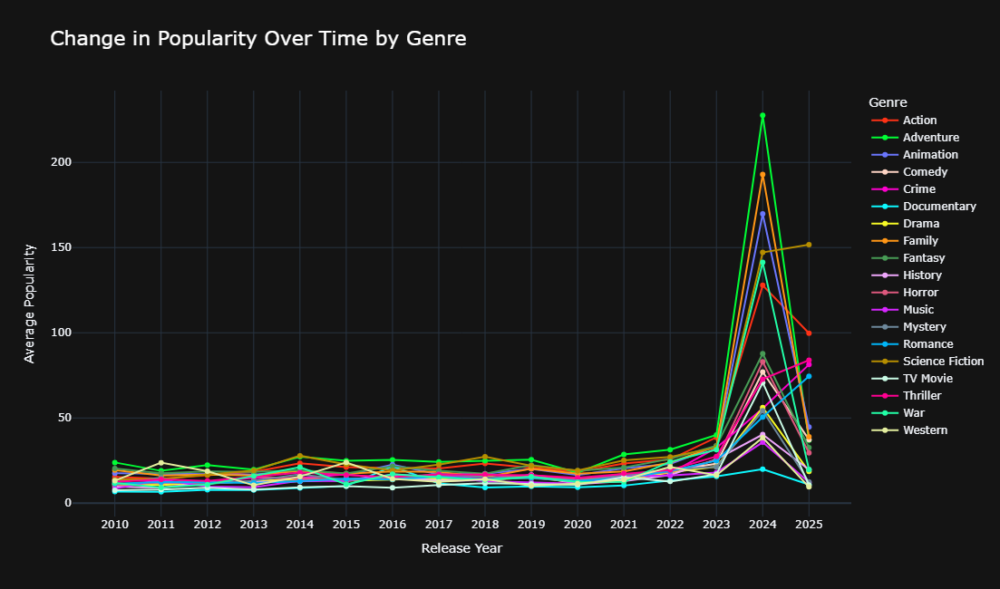

In [64]:
import plotly.express as px

# Assuming 'movies_exploded' contains columns ['genres', 'release_year', 'popularity']

# Step 1: Compute mean popularity per year per genre
popularity_trend = (
    movies_exploded
    .groupby(['genres', 'release_year'])['popularity']
    .mean()
    .reset_index()
)

# Step 2: Create interactive line plot
fig = px.line(
    popularity_trend,
    x='release_year',
    y='popularity',
    color='genres',
    markers=True,  # adds circular markers like plt.plot(marker='o')
    title="Change in Popularity Over Time by Genre",
    color_discrete_sequence=px.colors.qualitative.Light24  # 24-color palette (good for 19 genres)
)

# Step 3: Style and layout adjustments
fig.update_layout(
    width=1100,
    height=650,
    template='plotly_dark',
    title_font=dict(size=22, color='white'),
    xaxis_title='Release Year',
    yaxis_title='Average Popularity',
    legend_title='Genre',
    plot_bgcolor='#141414',
    paper_bgcolor='#141414',
    legend=dict(
        title='Genre',
        orientation='v',
        yanchor='top',
        y=1,
        xanchor='left',
        x=1.02
    )
)

# Step 4: Show every release year on x-axis (optional)
fig.update_xaxes(
    tickmode='linear',
    tick0=popularity_trend['release_year'].min(),
    dtick=1
)

# Step 5: Show interactive plot
fig.show()


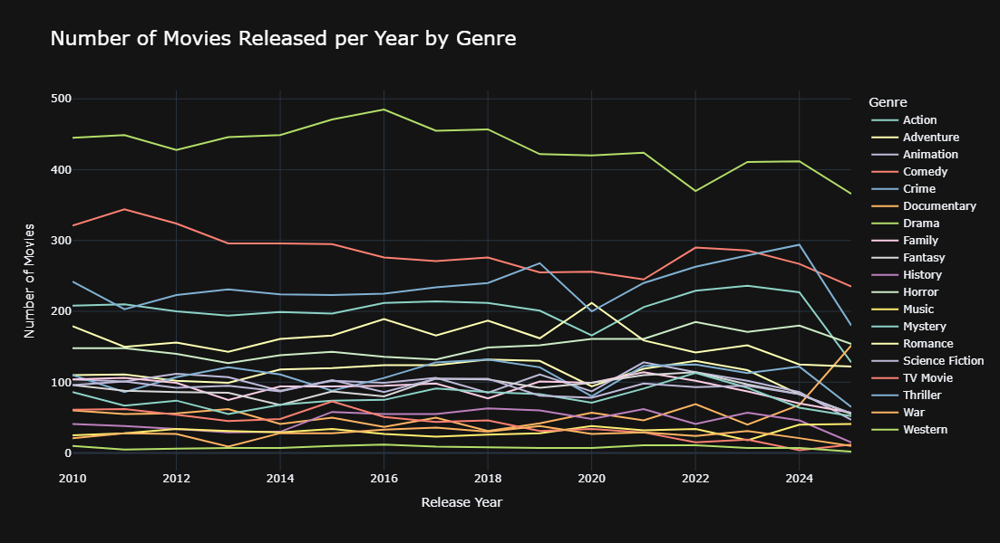

In [62]:
import pandas as pd
import plotly.express as px

# Assuming your DataFrame is named df and has columns 'release_year' and 'genre'
# Step 1: Count number of movies per year per genre
df=movies_exploded.copy()
movie_counts = (
    df.groupby(['release_year', 'genres'])
      .size()
      .reset_index(name='num_movies')
)

# Step 2: Create line plot
fig = px.line(
    movie_counts,
    x='release_year',
    y='num_movies',
    color='genres',  # each genre gets its own color
    title='Number of Movies Released per Year by Genre',
    color_discrete_sequence=px.colors.qualitative.Set3  # good for many categories (19)
)

# Step 3: Adjust layout
fig.update_layout(
    width=1000,
    height=600,
    template='plotly_dark',
    title_font=dict(size=22, color='white'),
    xaxis_title='Release Year',
    yaxis_title='Number of Movies',
    legend_title='Genre',
    plot_bgcolor='#141414',
    paper_bgcolor='#141414',
)

fig.show()


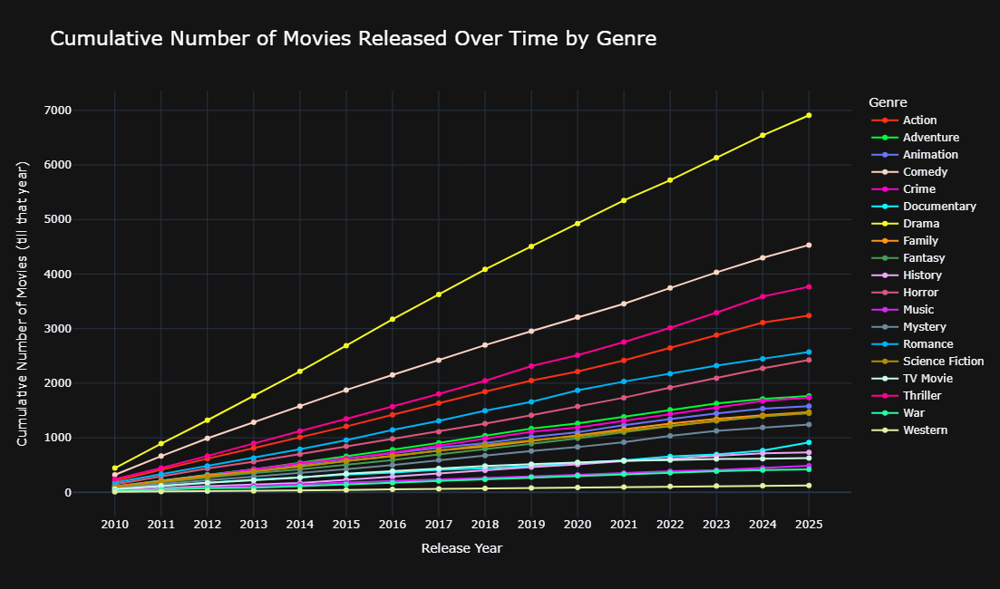

In [68]:
import pandas as pd
import plotly.express as px

# Copy your dataset
df = movies_exploded.copy()

# Step 1: Count number of movies released per year per genre
movie_counts = (
    df.groupby(['release_year', 'genres'])
      .size()
      .reset_index(name='num_movies')
)

# Step 2: Compute cumulative number of movies for each genre
movie_counts['cumulative_movies'] = (
    movie_counts
    .groupby('genres')['num_movies']
    .cumsum()   # cumulative sum per genre
)

# Step 3: Create interactive line plot
fig = px.line(
    movie_counts,
    x='release_year',
    y='cumulative_movies',
    color='genres',
    markers=True,
    title='Cumulative Number of Movies Released Over Time by Genre',
    color_discrete_sequence=px.colors.qualitative.Light24  # handles many genres well
)

# Step 4: Update layout for readability
fig.update_layout(
    width=1100,
    height=650,
    template='plotly_dark',
    title_font=dict(size=22, color='white'),
    xaxis_title='Release Year',
    yaxis_title='Cumulative Number of Movies (till that year)',
    legend_title='Genre',
    plot_bgcolor='#141414',
    paper_bgcolor='#141414',
    legend=dict(
        orientation='v',
        yanchor='top',
        y=1,
        xanchor='left',
        x=1.02
    )
)

# Step 5: Optional – make x-axis show all years
fig.update_xaxes(
    tickmode='linear',
    tick0=movie_counts['release_year'].min(),
    dtick=1
)

fig.show()


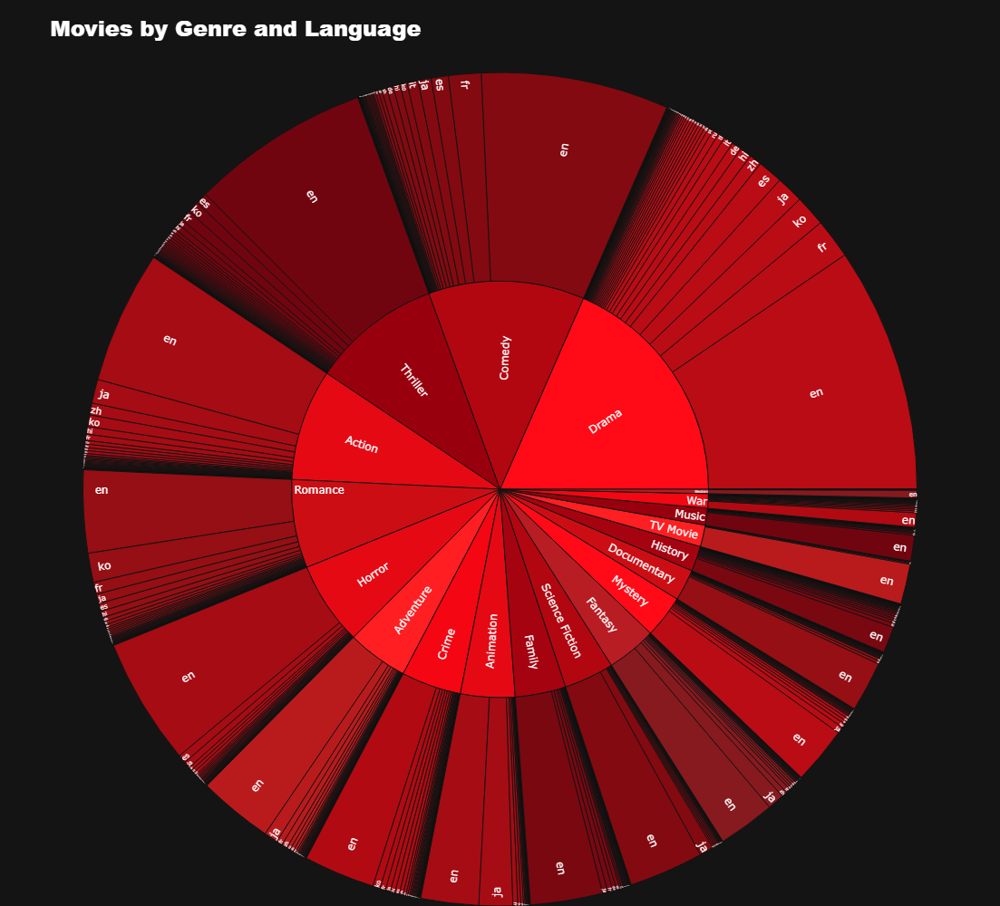

In [81]:
import plotly.express as px

# Copy dataset
df = movies_exploded.copy()

# Step 1: Aggregate movie counts by genre and language
genre_lang_counts = (
    df.groupby(['genres', 'language'])
      .size()
      .reset_index(name='num_movies')
)

# Step 2: Create Sunburst plot
fig = px.sunburst(
    genre_lang_counts,
    path=['genres', 'language'],  # hierarchy: Genre → Language
    values='num_movies',
    color='genres',
    color_discrete_sequence=[
        '#E50914', '#B20710', '#F40612', '#FF0A16', '#A60311',
        '#CC0E14', '#99000D', '#FF1E22', '#B81D24', '#E50914'
    ],  # Netflix-inspired red tones
    title='Movies by Genre and Language'
)

# Step 3: Customize layout for Netflix look
fig.update_layout(
    width=1000,
    height=1000,
    template='plotly_dark',
    title_font=dict(size=24, color='white', family='Arial Black'),
    font=dict(color='white'),
    paper_bgcolor='#141414',  # Netflix dark background
    plot_bgcolor='#141414',
    margin=dict(t=80, l=0, r=0, b=0)
)

# Optional: remove thin outlines for a cleaner look
fig.update_traces(
    hoverlabel=dict(bgcolor='white', font_color='black'),
    textfont=dict(color='white', size=12),
    insidetextorientation='radial'
)

fig.show()


In [85]:
dic={'Animation ,Family': 6.703772167487692,
 'Animation ,Romance': 7.010959183673473,
 'Animation ,Thriller': 6.537142857142857,
 'Animation ,Science Fiction': 6.796076666666667,
 'Animation ,Western': 7.013400000000002,
 'Animation ,Horror': 6.51493220338983,
 'Animation ,History': 6.69362962962963,
 'Animation ,Comedy': 6.728316568047331,
 'Animation ,Fantasy': 6.944435272045022,
 'Animation ,Documentary': 7.3961250000000005,
 'Animation ,Action': 6.802515418502201,
 'Animation ,Drama': 7.033176923076923,
 'Animation ,TV Movie': 7.055278688524591,
 'Animation ,War': 6.774380952380951,
 'Animation ,Music': 6.862806451612902,
 'Animation ,Adventure': 6.779389999999994,
 'Animation ,Mystery': 7.067451923076923,
 'Animation ,Crime': 6.874444444444445,
 'Family ,Romance': 6.423662921348316,
 'Family ,Thriller': 6.3635,
 'Family ,Science Fiction': 6.551341269841269,
 'Family ,Western': 7.222333333333334,
 'Family ,Horror': 6.787285714285714,
 'Family ,History': 6.9904375000000005,
 'Family ,Comedy': 6.472672172808132,
 'Family ,Fantasy': 6.564265350877192,
 'Family ,Documentary': 7.054866666666668,
 'Family ,Action': 6.547907407407409,
 'Family ,Drama': 6.6194028776978415,
 'Family ,TV Movie': 6.4601567164179095,
 'Family ,War': 6.3342857142857145,
 'Family ,Music': 6.652397058823531,
 'Family ,Adventure': 6.575573268921088,
 'Family ,Mystery': 7.033571428571434,
 'Family ,Crime': 6.281391304347826,
 'Romance ,Thriller': 5.95856,
 'Romance ,Science Fiction': 6.099848101265822,
 'Romance ,Western': 6.585714285714286,
 'Romance ,Horror': 5.279918032786884,
 'Romance ,History': 6.623303571428572,
 'Romance ,Comedy': 6.128391588785054,
 'Romance ,Fantasy': 6.580858108108108,
 'Romance ,Documentary': 5.012499999999999,
 'Romance ,Action': 5.927465517241378,
 'Romance ,Drama': 6.150581213307238,
 'Romance ,TV Movie': 6.174547872340423,
 'Romance ,War': 6.751310344827586,
 'Romance ,Music': 6.585409638554216,
 'Romance ,Adventure': 6.432603174603173,
 'Romance ,Mystery': 5.868558139534883,
 'Romance ,Crime': 6.127797101449276,
 'Thriller ,Science Fiction': 5.672908212560393,
 'Thriller ,Western': 6.17771875,
 'Thriller ,Horror': 5.578617058311571,
 'Thriller ,History': 6.590990099009901,
 'Thriller ,Comedy': 5.906476190476189,
 'Thriller ,Fantasy': 5.849629921259841,
 'Thriller ,Documentary': 6.626124999999999,
 'Thriller ,Action': 5.93834372367312,
 'Thriller ,Drama': 6.05841648898366,
 'Thriller ,TV Movie': 5.959585365853656,
 'Thriller ,War': 6.505560000000001,
 'Thriller ,Music': 5.9985333333333335,
 'Thriller ,Adventure': 5.8284851063829795,
 'Thriller ,Mystery': 5.883181451612907,
 'Thriller ,Crime': 6.1233979166666614,
 'Science Fiction ,Western': 5.8069999999999995,
 'Science Fiction ,Horror': 5.397810198300279,
 'Science Fiction ,History': 6.333333333333333,
 'Science Fiction ,Comedy': 6.042070312499996,
 'Science Fiction ,Fantasy': 6.142125714285715,
 'Science Fiction ,Documentary': 6.608,
 'Science Fiction ,Action': 6.0924635193132985,
 'Science Fiction ,Drama': 6.1495272727272745,
 'Science Fiction ,TV Movie': 5.535052631578949,
 'Science Fiction ,War': 6.09044,
 'Science Fiction ,Music': 5.185307692307693,
 'Science Fiction ,Adventure': 6.188800518134717,
 'Science Fiction ,Mystery': 5.9826402877697875,
 'Science Fiction ,Crime': 6.200464285714287,
 'Western ,Horror': 5.2896,
 'Western ,History': 6.900000000000001,
 'Western ,Comedy': 6.244733333333333,
 'Western ,Fantasy': 5.448142857142857,
 'Western ,Action': 5.87448888888889,
 'Western ,Drama': 6.3417246376811605,
 'Western ,Adventure': 6.194533333333333,
 'Western ,Mystery': 6.609624999999999,
 'Western ,Crime': 6.479499999999999,
 'Horror ,History': 6.016388888888888,
 'Horror ,Comedy': 5.472899713467047,
 'Horror ,Fantasy': 5.621473451327433,
 'Horror ,Documentary': 5.7299,
 'Horror ,Action': 5.471048192771086,
 'Horror ,Drama': 5.755779097387168,
 'Horror ,TV Movie': 5.123553571428571,
 'Horror ,War': 5.841105263157894,
 'Horror ,Music': 5.820230769230769,
 'Horror ,Adventure': 5.355139784946236,
 'Horror ,Mystery': 5.67314902807776,
 'Horror ,Crime': 5.835108108108109,
 'History ,Comedy': 6.802937499999999,
 'History ,Fantasy': 5.580157894736842,
 'History ,Documentary': 7.077058823529412,
 'History ,Action': 6.512993243243243,
 'History ,Drama': 6.6900779220779265,
 'History ,TV Movie': 6.512466666666667,
 'History ,War': 6.769941558441556,
 'History ,Music': 6.843285714285716,
 'History ,Adventure': 6.230181818181821,
 'History ,Mystery': 6.404937499999998,
 'History ,Crime': 6.8552173913043495,
 'Comedy ,Fantasy': 6.474484913793107,
 'Comedy ,Documentary': 6.24227027027027,
 'Comedy ,Action': 6.083804999999999,
 'Comedy ,Drama': 6.255237693389604,
 'Comedy ,TV Movie': 6.324078947368418,
 'Comedy ,War': 6.335099999999999,
 'Comedy ,Music': 6.717794520547943,
 'Comedy ,Adventure': 6.426360507246375,
 'Comedy ,Mystery': 6.45362658227848,
 'Comedy ,Crime': 6.1060393442622924,
 'Fantasy ,Documentary': 6.2,
 'Fantasy ,Action': 6.305766375545847,
 'Fantasy ,Drama': 6.334671270718234,
 'Fantasy ,TV Movie': 6.3172435897435895,
 'Fantasy ,War': 6.397692307692308,
 'Fantasy ,Music': 6.522274999999999,
 'Fantasy ,Adventure': 6.410884745762711,
 'Fantasy ,Mystery': 6.32623711340206,
 'Fantasy ,Crime': 6.042708333333334,
 'Documentary ,Action': 5.941416666666668,
 'Documentary ,Drama': 6.488163934426229,
 'Documentary ,TV Movie': 7.162520000000001,
 'Documentary ,War': 6.773999999999999,
 'Documentary ,Music': 7.054520325203252,
 'Documentary ,Adventure': 7.3554,
 'Documentary ,Mystery': 6.725,
 'Documentary ,Crime': 6.724918367346939,
 'Action ,Drama': 6.245582758620694,
 'Action ,TV Movie': 5.876624999999999,
 'Action ,War': 6.466456647398843,
 'Action ,Music': 5.23942857142857,
 'Action ,Adventure': 6.224772941176472,
 'Action ,Mystery': 6.085233830845772,
 'Action ,Crime': 6.135787318361951,
 'Drama ,TV Movie': 6.355903669724774,
 'Drama ,War': 6.683484745762705,
 'Drama ,Music': 6.495752380952378,
 'Drama ,Adventure': 6.485839650145774,
 'Drama ,Mystery': 6.044304545454548,
 'Drama ,Crime': 6.276533898305085,
 'TV Movie ,War': 6.16575,
 'TV Movie ,Music': 6.9369375,
 'TV Movie ,Adventure': 6.261852459016395,
 'TV Movie ,Mystery': 6.486189655172413,
 'TV Movie ,Crime': 6.5253265306122445,
 'War ,Music': 6.517333333333333,
 'War ,Adventure': 6.486,
 'War ,Mystery': 7.26,
 'War ,Crime': 6.930999999999999,
 'Music ,Adventure': 6.355846153846152,
 'Music ,Mystery': 6.7,
 'Music ,Crime': 6.6754999999999995,
 'Adventure ,Mystery': 6.3748068181818205,
 'Adventure ,Crime': 6.317634408602151,
 'Mystery ,Crime': 6.267904436860068}

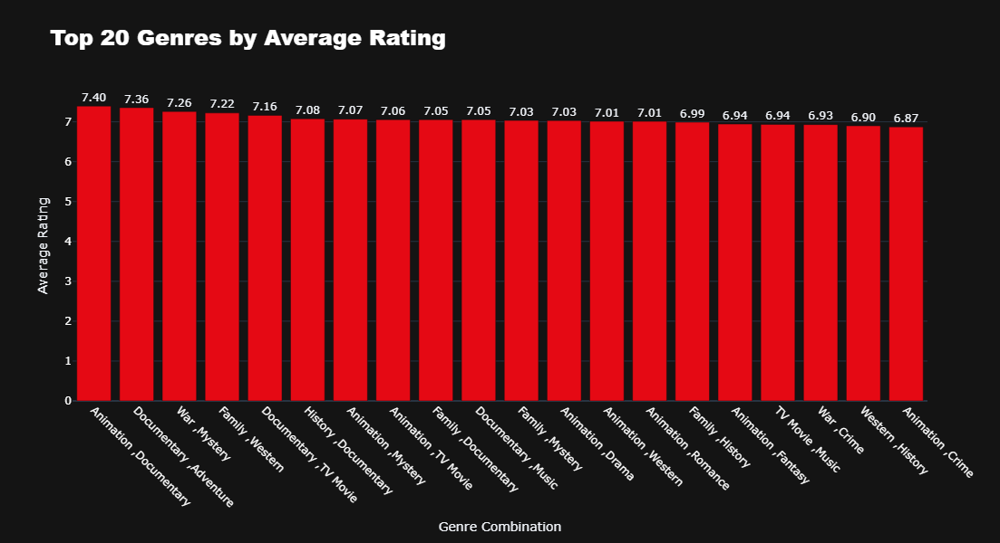

In [86]:
import pandas as pd
import plotly.express as px

# Example dictionary (replace with your actual one)
# genre_ratings = {'Drama': 4.2, 'Comedy': 3.8, 'Action': 4.0, ...}

# Step 1: Convert dictionary to DataFrame
df_genres = pd.DataFrame(list(dic.items()), columns=['Genre Combination', 'Average_Rating'])

# Step 2: Sort and take top 20
df_top20 = df_genres.sort_values(by='Average_Rating', ascending=False).head(20)

# Step 3: Create bar plot — no color mapping
fig = px.bar(
    df_top20,
    x='Genre Combination',
    y='Average_Rating',
    text='Average_Rating',
    title='Top 20 Genres by Average Rating',
)

# Step 4: Update traces to make all bars Netflix red
fig.update_traces(
    marker_color='#E50914',      # Netflix red
    texttemplate='%{text:.2f}',
    textposition='outside'
)

# Step 5: Style layout (Netflix theme)
fig.update_layout(
    width=1000,
    height=600,
    template='plotly_dark',
    title_font=dict(size=24, color='white', family='Arial Black'),
    xaxis_title='Genre Combination',
    yaxis_title='Average Rating',
    plot_bgcolor='#141414',
    paper_bgcolor='#141414',
    xaxis=dict(tickangle=45, tickfont=dict(size=12, color='white')),
    yaxis=dict(tickfont=dict(color='white')),
)

fig.show()


In [89]:
dic={'Science Fiction ,Drama': 21.02499393939392,
 'Science Fiction ,Thriller': 41.1862729468599,
 'Science Fiction ,History': 22.7165,
 'Science Fiction ,Documentary': 28.587249999999997,
 'Science Fiction ,Family': 50.22513492063493,
 'Science Fiction ,Music': 12.100076923076925,
 'Science Fiction ,Adventure': 40.98125129533678,
 'Science Fiction ,Horror': 25.98630028328612,
 'Science Fiction ,TV Movie': 10.561907894736839,
 'Science Fiction ,Crime': 15.865625000000003,
 'Science Fiction ,Western': 17.91466666666667,
 'Science Fiction ,Action': 39.94727038626607,
 'Science Fiction ,Fantasy': 16.613125714285697,
 'Science Fiction ,Comedy': 34.490835937500016,
 'Science Fiction ,Animation': 23.07875666666668,
 'Science Fiction ,Romance': 63.94781012658228,
 'Science Fiction ,Mystery': 20.396352517985612,
 'Science Fiction ,War': 18.61508,
 'Drama ,Thriller': 17.055789623312002,
 'Drama ,History': 16.35205844155846,
 'Drama ,Documentary': 10.719475409836065,
 'Drama ,Family': 15.454827338129506,
 'Drama ,Music': 14.669152380952383,
 'Drama ,Adventure': 28.694513119533546,
 'Drama ,Horror': 16.222467933491693,
 'Drama ,TV Movie': 9.135206422018351,
 'Drama ,Crime': 16.25160411622275,
 'Drama ,Western': 17.499275362318844,
 'Drama ,Action': 23.977942528735646,
 'Drama ,Fantasy': 17.10455801104974,
 'Drama ,Comedy': 14.8348452883263,
 'Drama ,Animation': 20.86979230769233,
 'Drama ,Romance': 17.74387606001305,
 'Drama ,Mystery': 14.443822727272734,
 'Drama ,War': 23.81659661016948,
 'Thriller ,History': 16.803415841584155,
 'Thriller ,Documentary': 21.867874999999998,
 'Thriller ,Family': 15.92495,
 'Thriller ,Music': 10.064333333333332,
 'Thriller ,Adventure': 31.462838297872345,
 'Thriller ,Horror': 22.98403394255876,
 'Thriller ,TV Movie': 11.671658536585367,
 'Thriller ,Crime': 25.391923958333315,
 'Thriller ,Western': 16.676375000000004,
 'Thriller ,Action': 33.48357792754839,
 'Thriller ,Fantasy': 17.74092125984251,
 'Thriller ,Comedy': 20.840099567099596,
 'Thriller ,Animation': 18.968190476190482,
 'Thriller ,Romance': 42.80750000000003,
 'Thriller ,Mystery': 16.2924260752688,
 'Thriller ,War': 22.516386666666666,
 'History ,Documentary': 9.792882352941175,
 'History ,Family': 11.17925,
 'History ,Music': 13.643514285714284,
 'History ,Adventure': 16.45789393939394,
 'History ,Horror': 14.537500000000001,
 'History ,TV Movie': 9.046066666666666,
 'History ,Crime': 15.98345652173913,
 'History ,Western': 14.506333333333336,
 'History ,Action': 17.90164189189189,
 'History ,Fantasy': 14.258157894736847,
 'History ,Comedy': 12.825916666666672,
 'History ,Animation': 11.506962962962962,
 'History ,Romance': 15.555500000000004,
 'History ,Mystery': 15.412812499999998,
 'History ,War': 17.33114935064935,
 'Documentary ,Family': 9.216733333333336,
 'Documentary ,Music': 10.62573983739837,
 'Documentary ,Adventure': 8.694933333333331,
 'Documentary ,Horror': 8.7566,
 'Documentary ,TV Movie': 13.283520000000003,
 'Documentary ,Crime': 10.214285714285714,
 'Documentary ,Action': 11.979333333333335,
 'Documentary ,Fantasy': 8.782,
 'Documentary ,Comedy': 11.428189189189192,
 'Documentary ,Animation': 68.81625,
 'Documentary ,Romance': 16.323875,
 'Documentary ,Mystery': 8.583874999999999,
 'Documentary ,War': 10.119428571428571,
 'Family ,Music': 21.493867647058824,
 'Family ,Adventure': 35.95509178743961,
 'Family ,Horror': 20.217523809523815,
 'Family ,TV Movie': 12.277440298507466,
 'Family ,Crime': 20.34730434782609,
 'Family ,Western': 34.94833333333333,
 'Family ,Action': 49.61529629629631,
 'Family ,Fantasy': 25.661660087719298,
 'Family ,Comedy': 32.747456162642926,
 'Family ,Animation': 34.014389162561585,
 'Family ,Romance': 15.193449438202245,
 'Family ,Mystery': 14.386303571428574,
 'Family ,War': 10.878,
 'Music ,Adventure': 24.20096153846152,
 'Music ,Horror': 15.919999999999998,
 'Music ,TV Movie': 14.347156250000003,
 'Music ,Crime': 11.3085,
 'Music ,Action': 15.425428571428572,
 'Music ,Fantasy': 19.183825,
 'Music ,Comedy': 17.38130821917808,
 'Music ,Animation': 25.465790322580645,
 'Music ,Romance': 13.634481927710846,
 'Music ,Mystery': 9.055,
 'Music ,War': 9.941666666666668,
 'Adventure ,Horror': 18.386107526881716,
 'Adventure ,TV Movie': 14.250754098360655,
 'Adventure ,Crime': 21.128763440860215,
 'Adventure ,Western': 23.69113333333333,
 'Adventure ,Action': 39.37256352941173,
 'Adventure ,Fantasy': 31.233225423728825,
 'Adventure ,Comedy': 31.99999456521739,
 'Adventure ,Animation': 39.31226333333333,
 'Adventure ,Romance': 20.425380952380955,
 'Adventure ,Mystery': 17.47959090909091,
 'Adventure ,War': 64.57351351351352,
 'Horror ,TV Movie': 12.089410714285716,
 'Horror ,Crime': 20.729531531531535,
 'Horror ,Western': 11.4528,
 'Horror ,Action': 25.764954819277104,
 'Horror ,Fantasy': 19.077039823008846,
 'Horror ,Comedy': 16.08812893982808,
 'Horror ,Animation': 18.247186440677968,
 'Horror ,Romance': 12.718098360655736,
 'Horror ,Mystery': 19.10022030237581,
 'Horror ,War': 13.457157894736843,
 'TV Movie ,Crime': 11.911020408163266,
 'TV Movie ,Action': 12.807375,
 'TV Movie ,Fantasy': 12.835923076923077,
 'TV Movie ,Comedy': 11.077578947368417,
 'TV Movie ,Animation': 16.771590163934423,
 'TV Movie ,Romance': 8.784797872340421,
 'TV Movie ,Mystery': 9.224568965517241,
 'TV Movie ,War': 7.0245,
 'Crime ,Western': 19.739625000000004,
 'Crime ,Action': 28.465840158520493,
 'Crime ,Fantasy': 13.227208333333337,
 'Crime ,Comedy': 18.94086557377049,
 'Crime ,Animation': 16.72811111111111,
 'Crime ,Romance': 14.61713043478261,
 'Crime ,Mystery': 15.603088737201364,
 'Crime ,War': 13.085230769230767,
 'Western ,Action': 14.359866666666663,
 'Western ,Fantasy': 14.04385714285714,
 'Western ,Comedy': 21.77906666666667,
 'Western ,Animation': 23.086999999999996,
 'Western ,Romance': 20.755857142857142,
 'Western ,Mystery': 17.63075,
 'Action ,Fantasy': 30.193384279475985,
 'Action ,Comedy': 34.22218833333336,
 'Action ,Animation': 27.742742290748907,
 'Action ,Romance': 23.69250862068965,
 'Action ,Mystery': 18.718079601990045,
 'Action ,War': 33.09882658959537,
 'Fantasy ,Comedy': 23.87031465517241,
 'Fantasy ,Animation': 28.808050656660424,
 'Fantasy ,Romance': 19.732601351351345,
 'Fantasy ,Mystery': 16.1880206185567,
 'Fantasy ,War': 22.787384615384617,
 'Comedy ,Animation': 31.634050295857985,
 'Comedy ,Romance': 16.54371121495326,
 'Comedy ,Mystery': 15.500392405063296,
 'Comedy ,War': 17.638750000000005,
 'Animation ,Romance': 19.872928571428563,
 'Animation ,Mystery': 17.132461538461534,
 'Animation ,War': 13.31338095238095,
 'Romance ,Mystery': 17.601232558139532,
 'Romance ,War': 14.385206896551725,
 'Mystery ,War': 17.206}

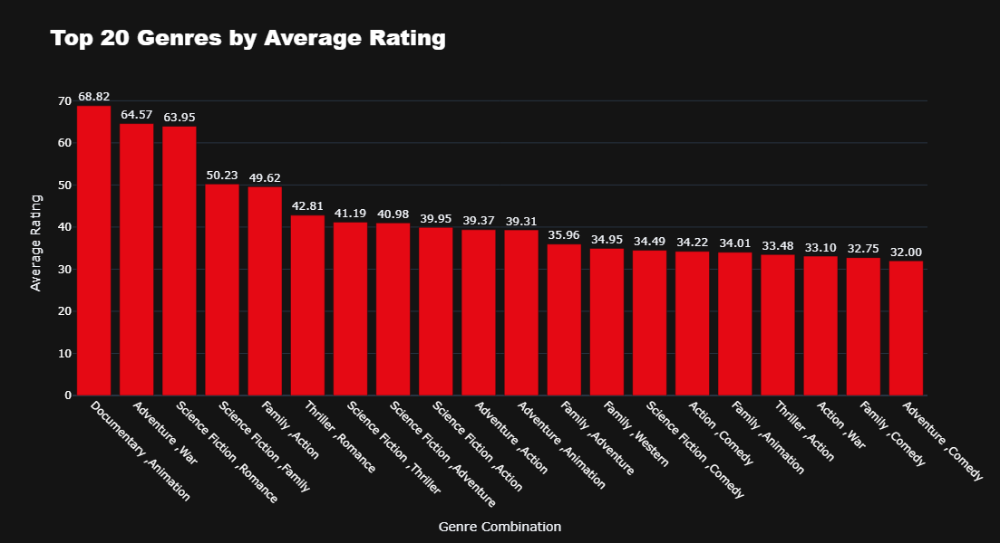

In [93]:
import pandas as pd
import plotly.express as px

# Example dictionary (replace with your actual one)
# genre_ratings = {'Drama': 4.2, 'Comedy': 3.8, 'Action': 4.0, ...}

# Step 1: Convert dictionary to DataFrame
df_genres = pd.DataFrame(list(dic.items()), columns=['Genre Combination', 'Average_Rating'])

# Step 2: Sort and take top 20
df_top20 = df_genres.sort_values(by='Average_Rating', ascending=False).head(20)

# Step 3: Create bar plot — no color mapping
fig = px.bar(
    df_top20,
    x='Genre Combination',
    y='Average_Rating',
    text='Average_Rating',
    title='Top 20 Genres by Average Rating',
)

# Step 4: Update traces to make all bars Netflix red
fig.update_traces(
    marker_color='#E50914',      # Netflix red
    texttemplate='%{text:.2f}',
    textposition='outside'
)

# Step 5: Style layout (Netflix theme)
fig.update_layout(
    width=1000,
    height=600,
    template='plotly_dark',
    title_font=dict(size=24, color='white', family='Arial Black'),
    xaxis_title='Genre Combination',
    yaxis_title='Average Rating',
    plot_bgcolor='#141414',
    paper_bgcolor='#141414',
    xaxis=dict(tickangle=45, tickfont=dict(size=12, color='white')),
    yaxis=dict(tickfont=dict(color='white')),
)

fig.show()


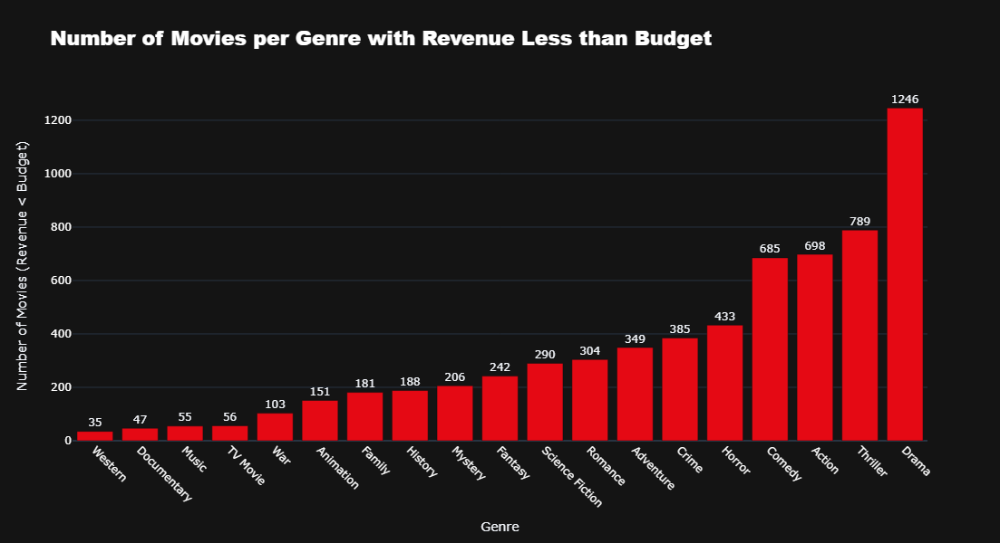

In [94]:
import pandas as pd
import plotly.express as px

# Assume your dataframe is named `movies_exploded` and has columns:
# ['genres', 'budget', 'revenue']

df = movies_exploded.copy()

# Step 1: Filter movies where revenue < budget
loss_df = df[df['revenue'] < df['budget']]

# Step 2: Count number of such movies per genre
loss_counts = (
    loss_df.groupby('genres')
    .size()
    .reset_index(name='num_loss_movies')
    .sort_values(by='num_loss_movies', ascending=True)  # ascending order
)

# Step 3: Create Plotly bar chart
fig = px.bar(
    loss_counts,
    x='genres',
    y='num_loss_movies',
    text='num_loss_movies',
    title='Number of Movies per Genre with Revenue Less than Budget',
)

# Step 4: Style (Netflix-style theme)
fig.update_traces(
    marker_color='#E50914',       # Netflix red
    texttemplate='%{text}', 
    textposition='outside'
)

fig.update_layout(
    width=1000,
    height=600,
    template='plotly_dark',
    title_font=dict(size=22, color='white', family='Arial Black'),
    xaxis_title='Genre',
    yaxis_title='Number of Movies (Revenue < Budget)',
    plot_bgcolor='#141414',
    paper_bgcolor='#141414',
    xaxis=dict(
        tickangle=45,
        categoryorder='total ascending',  # ensures ascending order on x-axis
        tickfont=dict(color='white')
    ),
    yaxis=dict(tickfont=dict(color='white')),
)

fig.show()


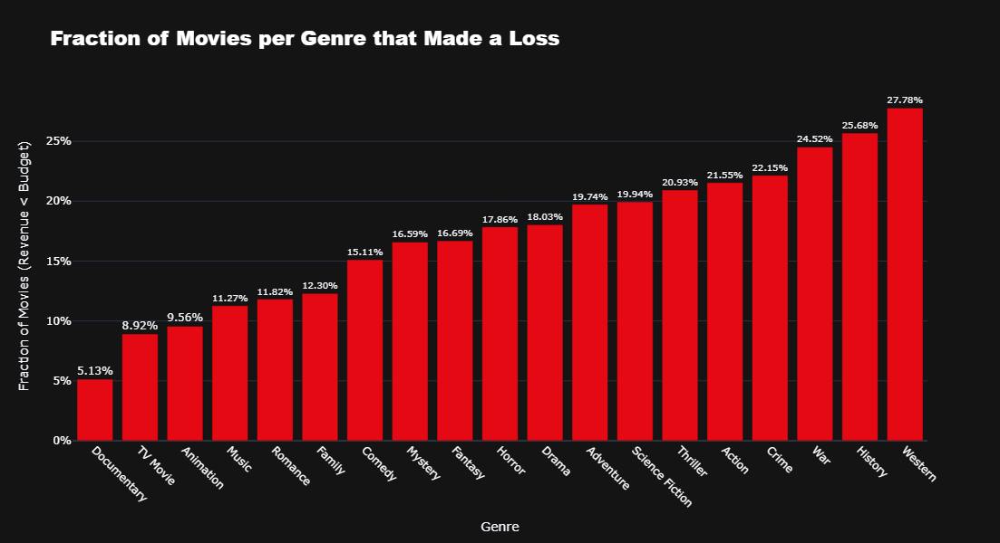

In [95]:
import pandas as pd
import plotly.express as px

# Assume your dataframe is named movies_exploded and has columns:
# ['genres', 'budget', 'revenue']

df = movies_exploded.copy()

# Step 1: Compute total movies per genre
total_counts = df.groupby('genres').size().reset_index(name='total_movies')

# Step 2: Compute loss-making movies per genre
loss_counts = (
    df[df['revenue'] < df['budget']]
    .groupby('genres')
    .size()
    .reset_index(name='loss_movies')
)

# Step 3: Merge and compute fraction (loss_movies / total_movies)
genre_stats = pd.merge(total_counts, loss_counts, on='genres', how='left').fillna(0)
genre_stats['loss_fraction'] = genre_stats['loss_movies'] / genre_stats['total_movies']

# Step 4: Sort by fraction ascending
genre_stats = genre_stats.sort_values(by='loss_fraction', ascending=True)

# Step 5: Plot
fig = px.bar(
    genre_stats,
    x='genres',
    y='loss_fraction',
    text=genre_stats['loss_fraction'].apply(lambda x: f"{x:.2%}"),  # show as percentage
    title='Fraction of Movies per Genre that Made a Loss',
)

# Step 6: Netflix-style aesthetics
fig.update_traces(
    marker_color='#E50914',  # Netflix red
    textposition='outside'
)

fig.update_layout(
    width=1000,
    height=600,
    template='plotly_dark',
    title_font=dict(size=22, color='white', family='Arial Black'),
    xaxis_title='Genre',
    yaxis_title='Fraction of Movies (Revenue < Budget)',
    plot_bgcolor='#141414',
    paper_bgcolor='#141414',
    xaxis=dict(
        tickangle=45,
        categoryorder='total ascending',  # ascending order by fraction
        tickfont=dict(color='white')
    ),
    yaxis=dict(
        tickformat='.0%',  # show y-axis as percentages
        tickfont=dict(color='white')
    )
)

fig.show()


In [96]:
import pandas as pd
from scipy.stats import chi2_contingency

# Step 1: Create a binary 'profitable' column
# (1 if revenue > budget, 0 otherwise)
movies=movies_exploded.copy()
movies['profitable'] = (movies['revenue'] > movies['budget']).astype(int)

# Step 2: Handle multiple genres (split and explode if needed)
# If your genres are like "Action, Adventure", split and explode
movies_exploded = movies.assign(genres=movies['genres'].str.split(', ')).explode('genres')

# Step 3: Create the contingency table
# Rows: genres, Columns: profitable (0 or 1)
contingency_table = pd.crosstab(movies_exploded['genres'], movies_exploded['profitable'])

# Step 4: Perform Chi-square test of independence
chi2, p, dof, expected = chi2_contingency(contingency_table)

# Step 5: Print results
print("Chi-square Statistic:", chi2)
print("Degrees of Freedom:", dof)
print("P-value:", p)

# Step 6: Interpretation
alpha = 0.05
if p < alpha:
    print("\n✅ Reject the null hypothesis: Profitability depends on genre.")
else:
    print("\n❌ Fail to reject the null hypothesis: Profitability does not depend on genre.")


Chi-square Statistic: 642.0430223119432
Degrees of Freedom: 18
P-value: 1.0959895445890484e-124

✅ Reject the null hypothesis: Profitability depends on genre.


In [98]:
contingency_table

profitable,0,1
genres,,
Action,2195,1044
Adventure,1009,759
Animation,1064,515
Comedy,3142,1391
Crime,1218,520
Documentary,773,143
Drama,4887,2023
Family,972,500
Fantasy,930,520


# TV shows only

In [33]:
sum(shows['rating']!=shows['vote_average'])

0

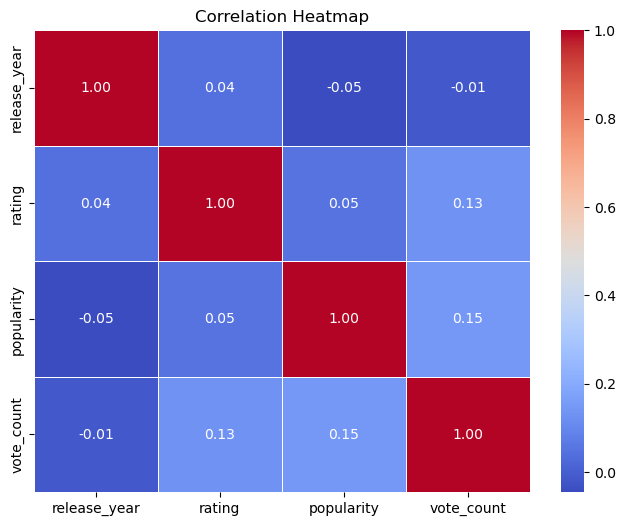

In [34]:
df=shows.select_dtypes(include=['number'])
df.drop(columns=['show_id','vote_average'],inplace=True)
corr = df.corr()

# Plot the heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Heatmap')
plt.show()

In [35]:
missing_percentage = shows.isnull().mean() * 100
print(missing_percentage)

show_id          0.00000
type             0.00000
title            0.00000
director        68.53125
cast             7.23125
country         11.23125
date_added       0.00000
release_year     0.00000
rating           0.00000
duration         0.00000
genres           6.08750
language         0.00000
description     20.03750
popularity       0.00000
vote_count       0.00000
vote_average     0.00000
dtype: float64


In [55]:
shows['duration'].unique()

array(['1 Seasons'], dtype=object)

In [56]:
shows=shows.fillna('missing')

In [57]:
shows_exp=shows.copy()
shows_exp['genres']=shows_exp['genres'].apply(lambda x: [genre.strip() for genre in x.split(',')])

In [58]:
df=shows.copy()
df['genres'] = df['genres'].str.split(', ')
shows_exploded = df.explode('genres', ignore_index=True)
shows_exploded=shows_exploded[shows_exploded['genres']!='missing']
shows_exploded=shows_exploded[shows_exploded['genres']!='Unknown']

## Ratings vs Genre sorted by median rating

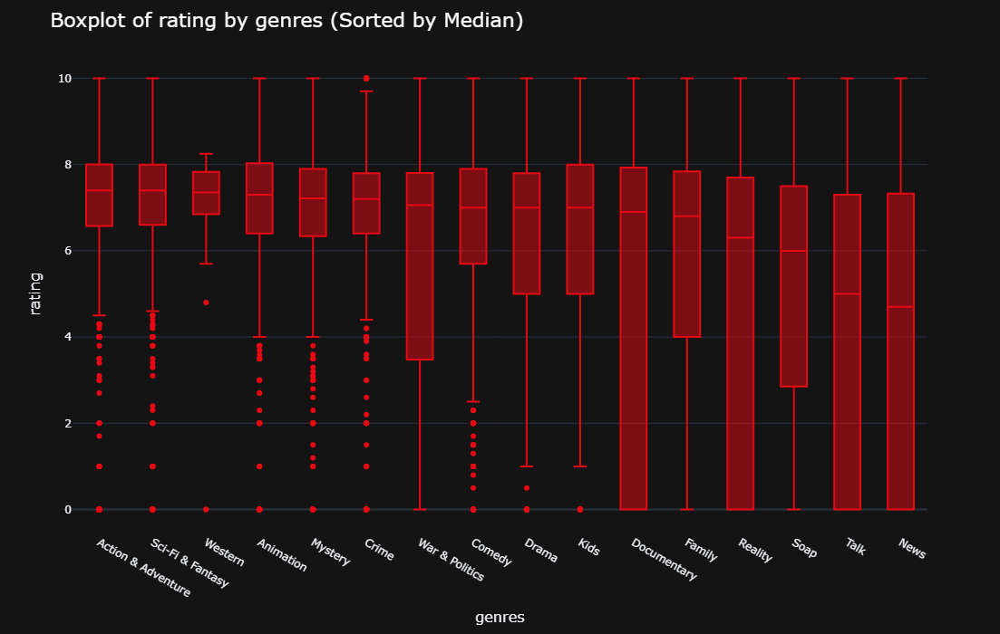

In [59]:
generate_boxplot_interactive(shows_exploded,'genres','rating',True)

In [41]:
f_stat,f_crit,sse_rating=Ftest(shows_exploded,'genres','rating',0.05)
print(f_stat," ",f_crit)

78.7800181094138   1.6667387852399038


In [42]:
dic=LSD_test(shows_exploded,'genres','rating',sse_rating,0.05)

In [43]:
for key,val in dic.items():
    if len(val)==0:
        print(key,"is not significantly higher rated than any genre")
        print()
    else:
        print(key,"is significantly higher rated than the following genres:")
        for g in val:
            print(g)
        print()

Reality is significantly higher rated than the following genres:
News
Talk

News is not significantly higher rated than any genre

Comedy is significantly higher rated than the following genres:
Reality
News
Talk
Drama
Soap
Family
War & Politics
Documentary

Talk is not significantly higher rated than any genre

Action & Adventure is significantly higher rated than the following genres:
Reality
News
Comedy
Talk
Drama
Soap
Crime
Mystery
Family
War & Politics
Documentary
Kids

Sci-Fi & Fantasy is significantly higher rated than the following genres:
Reality
News
Comedy
Talk
Drama
Soap
Crime
Mystery
Family
War & Politics
Documentary
Kids

Western is significantly higher rated than the following genres:
Reality
News
Talk
Soap
Family
Documentary

Drama is significantly higher rated than the following genres:
Reality
News
Talk
Soap
Family
Documentary

Soap is significantly higher rated than the following genres:
News
Talk

Animation is significantly higher rated than the following genres:
Re

## Popularity vs genre sorted by median popularity

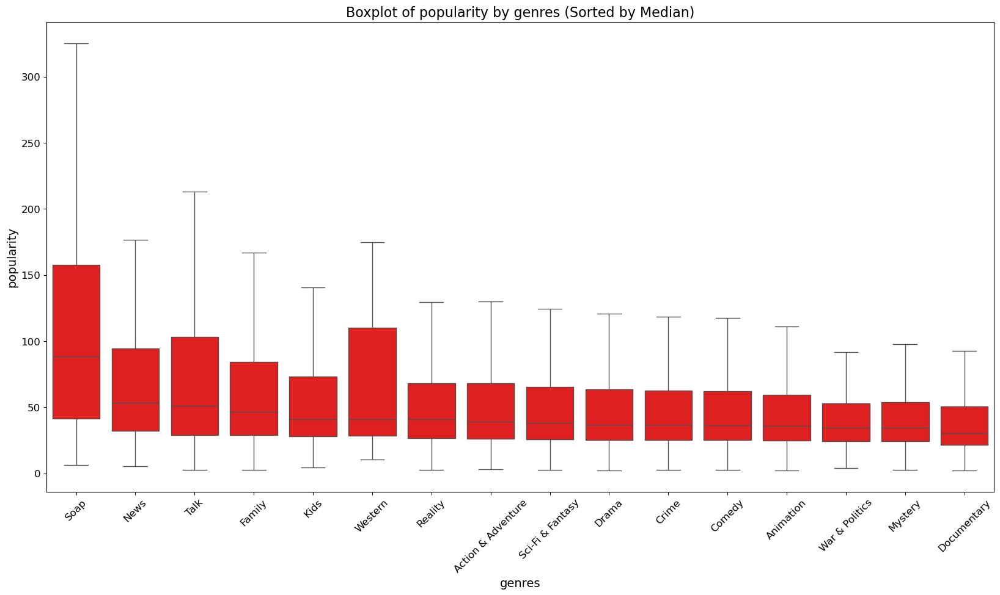

In [44]:
generate_boxplot(shows_exploded,'genres','popularity',False)

In [45]:
f_stat,f_crit,sse_pop=Ftest(shows_exploded,'genres','popularity',0.05)
print(f_stat," ",f_crit)

31.626170084289118   1.6667387852399038


In [46]:
dic=LSD_test(shows_exploded,'genres','popularity',sse_pop,0.05)

In [47]:
for key,val in dic.items():
    if len(val)==0:
        print(key,"is not significantly higher popularity rated than any genre")
        print()
    else:
        print(key,"is significantly higher popularity rated than the following genres:")
        for g in val:
            print(g)
        print()

Reality is significantly higher popularity rated than the following genres:
Comedy
Action & Adventure
Sci-Fi & Fantasy
Drama
Animation
Crime
Mystery
War & Politics
Documentary
Kids

News is significantly higher popularity rated than the following genres:
Comedy
Action & Adventure
Sci-Fi & Fantasy
Drama
Animation
Crime
Mystery
War & Politics
Documentary
Kids

Comedy is significantly higher popularity rated than the following genres:
Animation
Mystery
Documentary

Talk is significantly higher popularity rated than the following genres:
Reality
News
Comedy
Action & Adventure
Sci-Fi & Fantasy
Drama
Animation
Crime
Mystery
Family
War & Politics
Documentary
Kids

Action & Adventure is significantly higher popularity rated than the following genres:
Animation
Mystery
Documentary

Sci-Fi & Fantasy is significantly higher popularity rated than the following genres:
Documentary

Western is not significantly higher popularity rated than any genre

Drama is significantly higher popularity rated th

In [48]:
movies.columns

Index(['show_id', 'type', 'title', 'director', 'cast', 'country', 'date_added',
       'release_year', 'rating', 'genres', 'language', 'description',
       'popularity', 'vote_count', 'vote_average', 'budget', 'revenue'],
      dtype='object')

In [49]:
shows.columns

Index(['show_id', 'type', 'title', 'director', 'cast', 'country', 'date_added',
       'release_year', 'rating', 'duration', 'genres', 'language',
       'description', 'popularity', 'vote_count', 'vote_average'],
      dtype='object')

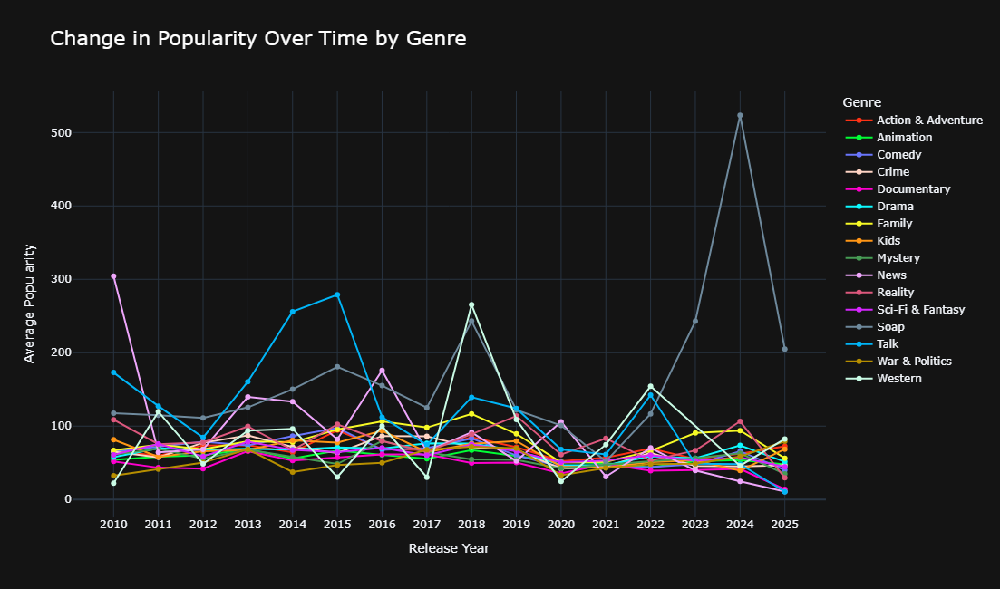

In [75]:
import plotly.express as px

# Assuming 'movies_exploded' contains columns ['genres', 'release_year', 'popularity']

# Step 1: Compute mean popularity per year per genre
popularity_trend = (
    shows_exploded
    .groupby(['genres', 'release_year'])['popularity']
    .mean()
    .reset_index()
)

# Step 2: Create interactive line plot
fig = px.line(
    popularity_trend,
    x='release_year',
    y='popularity',
    color='genres',
    markers=True,  # adds circular markers like plt.plot(marker='o')
    title="Change in Popularity Over Time by Genre",
    color_discrete_sequence=px.colors.qualitative.Light24  # 24-color palette (good for 19 genres)
)

# Step 3: Style and layout adjustments
fig.update_layout(
    width=1100,
    height=650,
    template='plotly_dark',
    title_font=dict(size=22, color='white'),
    xaxis_title='Release Year',
    yaxis_title='Average Popularity',
    legend_title='Genre',
    plot_bgcolor='#141414',
    paper_bgcolor='#141414',
    legend=dict(
        title='Genre',
        orientation='v',
        yanchor='top',
        y=1,
        xanchor='left',
        x=1.02
    )
)

# Step 4: Show every release year on x-axis (optional)
fig.update_xaxes(
    tickmode='linear',
    tick0=popularity_trend['release_year'].min(),
    dtick=1
)

# Step 5: Show interactive plot
fig.show()


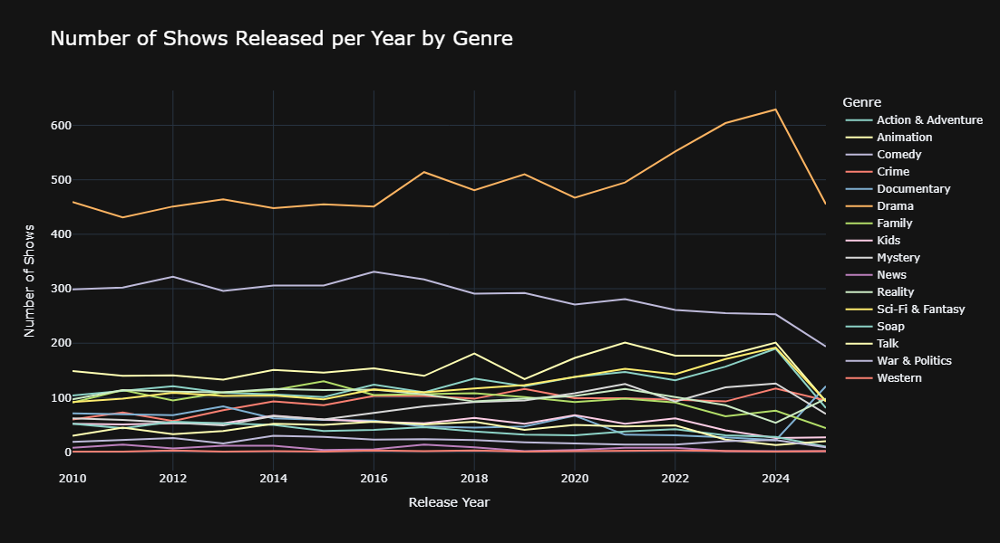

In [77]:
import pandas as pd
import plotly.express as px

# Assuming your DataFrame is named df and has columns 'release_year' and 'genre'
# Step 1: Count number of movies per year per genre
df=shows_exploded.copy()
movie_counts = (
    df.groupby(['release_year', 'genres'])
      .size()
      .reset_index(name='num_movies')
)

# Step 2: Create line plot
fig = px.line(
    movie_counts,
    x='release_year',
    y='num_movies',
    color='genres',  # each genre gets its own color
    title='Number of Shows Released per Year by Genre',
    color_discrete_sequence=px.colors.qualitative.Set3  # good for many categories (19)
)

# Step 3: Adjust layout
fig.update_layout(
    width=1000,
    height=600,
    template='plotly_dark',
    title_font=dict(size=22, color='white'),
    xaxis_title='Release Year',
    yaxis_title='Number of Shows',
    legend_title='Genre',
    plot_bgcolor='#141414',
    paper_bgcolor='#141414',
)

fig.show()


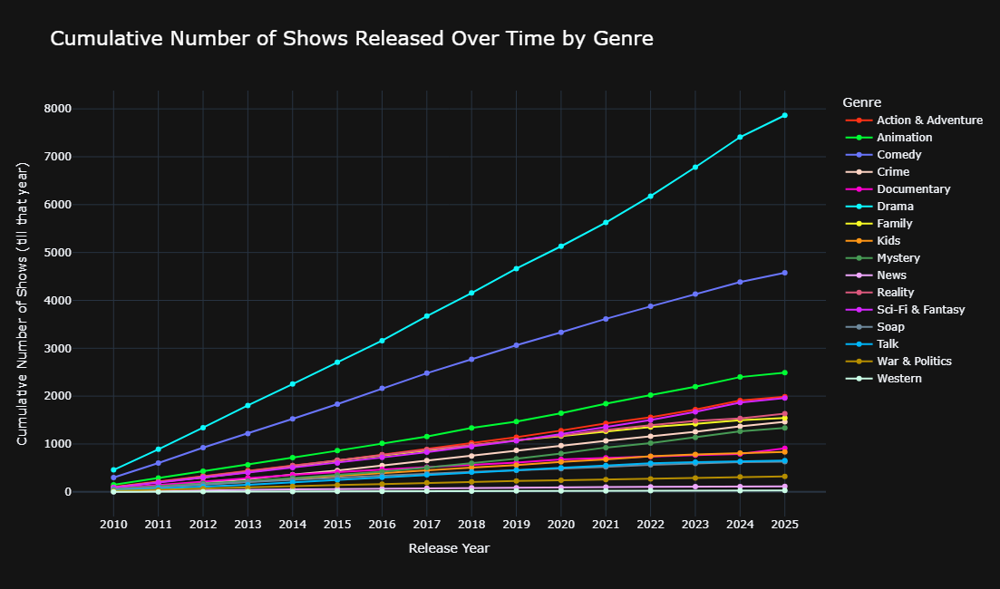

In [78]:
import pandas as pd
import plotly.express as px

# Copy your dataset
df = shows_exploded.copy()

# Step 1: Count number of movies released per year per genre
movie_counts = (
    df.groupby(['release_year', 'genres'])
      .size()
      .reset_index(name='num_movies')
)

# Step 2: Compute cumulative number of movies for each genre
movie_counts['cumulative_movies'] = (
    movie_counts
    .groupby('genres')['num_movies']
    .cumsum()   # cumulative sum per genre
)

# Step 3: Create interactive line plot
fig = px.line(
    movie_counts,
    x='release_year',
    y='cumulative_movies',
    color='genres',
    markers=True,
    title='Cumulative Number of Shows Released Over Time by Genre',
    color_discrete_sequence=px.colors.qualitative.Light24  # handles many genres well
)

# Step 4: Update layout for readability
fig.update_layout(
    width=1100,
    height=650,
    template='plotly_dark',
    title_font=dict(size=22, color='white'),
    xaxis_title='Release Year',
    yaxis_title='Cumulative Number of Shows (till that year)',
    legend_title='Genre',
    plot_bgcolor='#141414',
    paper_bgcolor='#141414',
    legend=dict(
        orientation='v',
        yanchor='top',
        y=1,
        xanchor='left',
        x=1.02
    )
)

# Step 5: Optional – make x-axis show all years
fig.update_xaxes(
    tickmode='linear',
    tick0=movie_counts['release_year'].min(),
    dtick=1
)

fig.show()


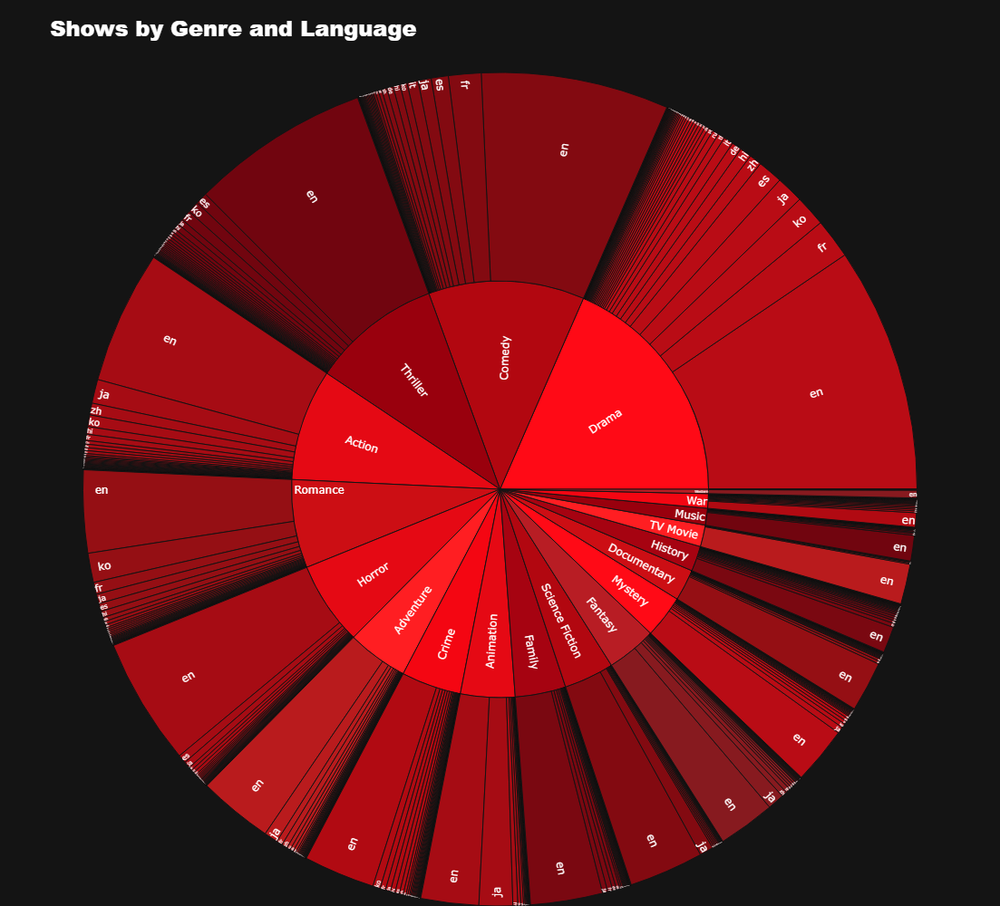

In [80]:
import plotly.express as px

# Copy dataset
df = movies_exploded.copy()

# Step 1: Aggregate movie counts by genre and language
genre_lang_counts = (
    df.groupby(['genres', 'language'])
      .size()
      .reset_index(name='num_movies')
)

# Step 2: Create Sunburst plot
fig = px.sunburst(
    genre_lang_counts,
    path=['genres', 'language'],  # hierarchy: Genre → Language
    values='num_movies',
    color='genres',
    color_discrete_sequence=[
        '#E50914', '#B20710', '#F40612', '#FF0A16', '#A60311',
        '#CC0E14', '#99000D', '#FF1E22', '#B81D24', '#E50914'
    ],  # Netflix-inspired red tones
    title='Shows by Genre and Language'
)

# Step 3: Customize layout for Netflix look
fig.update_layout(
    width=1000,
    height=1000,
    template='plotly_dark',
    title_font=dict(size=24, color='white', family='Arial Black'),
    font=dict(color='white'),
    paper_bgcolor='#141414',  # Netflix dark background
    plot_bgcolor='#141414',
    margin=dict(t=80, l=0, r=0, b=0)
)

# Optional: remove thin outlines for a cleaner look
fig.update_traces(
    hoverlabel=dict(bgcolor='white', font_color='black'),
    textfont=dict(color='white', size=12),
    insidetextorientation='radial'
)

fig.show()


In [87]:
dic={'Drama ,Action & Adventure': 6.662406392694064,
 'Drama ,Mystery': 6.521516806722694,
 'Drama ,Kids': 5.647910256410256,
 'Drama ,Comedy': 6.176691521346972,
 'Drama ,Western': 7.098649999999999,
 'Drama ,Documentary': 6.813968749999999,
 'Drama ,Unknown': 5.619287671232877,
 'Drama ,Talk': 5.111111111111111,
 'Drama ,Animation': 7.24181359649123,
 'Drama ,Reality': 6.125584415584414,
 'Drama ,War & Politics': 5.521370967741933,
 'Drama ,Sci-Fi & Fantasy': 6.571832026875698,
 'Drama ,Crime': 6.6063973256924555,
 'Drama ,Soap': 5.355972281449893,
 'Drama ,Family': 5.325178343949043,
 'Drama ,News': 7.3,
 'Action & Adventure ,Mystery': 6.884989898989897,
 'Action & Adventure ,Kids': 6.709835680751175,
 'Action & Adventure ,Comedy': 6.96639365671641,
 'Action & Adventure ,Western': 6.296,
 'Action & Adventure ,Documentary': 6.488187500000001,
 'Action & Adventure ,Talk': 5.133333333333334,
 'Action & Adventure ,Animation': 7.153025826446273,
 'Action & Adventure ,Reality': 6.609541666666668,
 'Action & Adventure ,War & Politics': 6.704106666666668,
 'Action & Adventure ,Sci-Fi & Fantasy': 7.056924508790062,
 'Action & Adventure ,Crime': 6.70922844827586,
 'Action & Adventure ,Soap': 7.0955,
 'Action & Adventure ,Family': 6.936427631578952,
 'Mystery ,Kids': 5.748696969696969,
 'Mystery ,Comedy': 6.978216216216218,
 'Mystery ,Western': 6.9,
 'Mystery ,Documentary': 7.243448275862069,
 'Mystery ,Unknown': 6.340000000000001,
 'Mystery ,Talk': 4.68,
 'Mystery ,Animation': 7.584060000000003,
 'Mystery ,Reality': 6.2714285714285705,
 'Mystery ,War & Politics': 6.779529411764706,
 'Mystery ,Sci-Fi & Fantasy': 6.961425925925927,
 'Mystery ,Crime': 6.619093607305938,
 'Mystery ,Soap': 5.393780487804878,
 'Mystery ,Family': 6.201932203389831,
 'Kids ,Comedy': 6.493463722397476,
 'Kids ,Documentary': 3.83125,
 'Kids ,Talk': 5.225,
 'Kids ,Animation': 6.084003294892912,
 'Kids ,Reality': 5.347058823529412,
 'Kids ,War & Politics': 7.0,
 'Kids ,Sci-Fi & Fantasy': 6.662466666666671,
 'Kids ,Crime': 6.969,
 'Kids ,Soap': 6.471428571428571,
 'Kids ,Family': 6.44149146757679,
 'Kids ,News': 5.0,
 'Comedy ,Western': 3.7035,
 'Comedy ,Documentary': 6.070270833333333,
 'Comedy ,Unknown': 6.047619047619048,
 'Comedy ,Talk': 5.082993827160493,
 'Comedy ,Animation': 6.9019775,
 'Comedy ,Reality': 5.789664516129032,
 'Comedy ,War & Politics': 6.510363636363636,
 'Comedy ,Sci-Fi & Fantasy': 6.942268104776573,
 'Comedy ,Crime': 6.868409090909091,
 'Comedy ,Soap': 5.357032000000001,
 'Comedy ,Family': 6.09250151057402,
 'Comedy ,News': 5.222481481481482,
 'Western ,Animation': 4.533333333333334,
 'Western ,Sci-Fi & Fantasy': 7.9705,
 'Western ,Crime': 7.161199999999999,
 'Western ,Family': 3.95,
 'Documentary ,Unknown': 7.666666666666667,
 'Documentary ,Talk': 5.022916666666666,
 'Documentary ,Animation': 4.875,
 'Documentary ,Reality': 5.740117977528091,
 'Documentary ,War & Politics': 6.741041666666667,
 'Documentary ,Sci-Fi & Fantasy': 7.528571428571428,
 'Documentary ,Crime': 6.602801801801804,
 'Documentary ,Soap': 6.433333333333333,
 'Documentary ,Family': 4.8805555555555555,
 'Documentary ,News': 4.2153846153846155,
 'Unknown ,Animation': 6.5,
 'Unknown ,Sci-Fi & Fantasy': 6.05,
 'Unknown ,Crime': 6.1,
 'Unknown ,Soap': 6.275,
 'Unknown ,Family': 5.048,
 'Talk ,Animation': 5.441750000000001,
 'Talk ,Reality': 4.625141509433962,
 'Talk ,War & Politics': 5.666666666666667,
 'Talk ,Sci-Fi & Fantasy': 5.5,
 'Talk ,Crime': 5.4875,
 'Talk ,Soap': 2.5,
 'Talk ,Family': 3.7719473684210527,
 'Talk ,News': 4.205872340425532,
 'Animation ,War & Politics': 7.342,
 'Animation ,Sci-Fi & Fantasy': 7.151852040816318,
 'Animation ,Crime': 7.594133333333332,
 'Animation ,Soap': 1.625,
 'Animation ,Family': 6.587009118541033,
 'Reality ,War & Politics': 9.2,
 'Reality ,Sci-Fi & Fantasy': 7.82,
 'Reality ,Crime': 5.705405405405406,
 'Reality ,Soap': 2.675,
 'Reality ,Family': 5.668799999999999,
 'Reality ,News': 2.0,
 'War & Politics ,Sci-Fi & Fantasy': 7.486807692307693,
 'War & Politics ,Crime': 6.980666666666666,
 'War & Politics ,Soap': 4.075,
 'War & Politics ,Family': 5.840111111111112,
 'War & Politics ,News': 6.8,
 'Sci-Fi & Fantasy ,Crime': 7.15325925925926,
 'Sci-Fi & Fantasy ,Soap': 6.201333333333333,
 'Sci-Fi & Fantasy ,Family': 6.913335570469802,
 'Crime ,Soap': 5.454413793103448,
 'Crime ,Family': 4.854291666666666,
 'Crime ,News': 3.95,
 'Soap ,Family': 5.467476190476191,
 'Family ,News': 5.5}

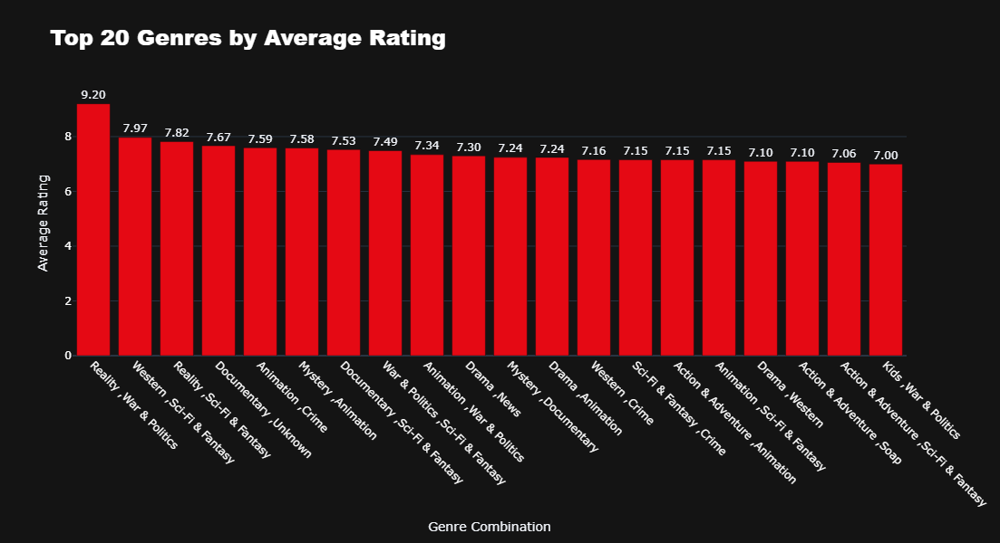

In [88]:
import pandas as pd
import plotly.express as px

# Example dictionary (replace with your actual one)
# genre_ratings = {'Drama': 4.2, 'Comedy': 3.8, 'Action': 4.0, ...}

# Step 1: Convert dictionary to DataFrame
df_genres = pd.DataFrame(list(dic.items()), columns=['Genre Combination', 'Average_Rating'])

# Step 2: Sort and take top 20
df_top20 = df_genres.sort_values(by='Average_Rating', ascending=False).head(20)

# Step 3: Create bar plot — no color mapping
fig = px.bar(
    df_top20,
    x='Genre Combination',
    y='Average_Rating',
    text='Average_Rating',
    title='Top 20 Genres by Average Rating',
)

# Step 4: Update traces to make all bars Netflix red
fig.update_traces(
    marker_color='#E50914',      # Netflix red
    texttemplate='%{text:.2f}',
    textposition='outside'
)

# Step 5: Style layout (Netflix theme)
fig.update_layout(
    width=1000,
    height=600,
    template='plotly_dark',
    title_font=dict(size=24, color='white', family='Arial Black'),
    xaxis_title='Genre Combination',
    yaxis_title='Average Rating',
    plot_bgcolor='#141414',
    paper_bgcolor='#141414',
    xaxis=dict(tickangle=45, tickfont=dict(size=12, color='white')),
    yaxis=dict(tickfont=dict(color='white')),
)

fig.show()
